In [1]:
import numpy as np
from pathlib import Path
import yaml

from src.dimer import DIMER
from src.anm import ANM
from src.optim import Optimizer
from src.utils import A_0, nm

In [2]:
args = {
    'target_angle': np.pi / 2.,
    'target_dist': A_0 * nm,
     'w_dist_orient': 0.5,
     'w_reg': 500.0,
     'w_phase': 0.0,
     'cma_sigma': 0.25,
     'cma_opts': {"popsize": 100, "tolfun": 1e-3, "tolx": 1e-3},
     'ZeroCoeffs': [0, 1, 2, 5, 6, 7, 8, 9, 10],
     'x_0_init': 0.25,
     'width': 400 * nm,
     'polarization': [1, 1j],
     'Nmax': 4,
     'rho_scale':1.0,
     'power': 0.25,
     'radius': 75 * nm,
     'lmax': 2,
     'wavelength': 770 * nm,
     'e_field_sampling': 50,
     'min_sep_dist': 200 * nm,
     'max_sep_fac': 2,
     'save_path': 'test/test_0',
     'save_freq': 10,
     'sim_init_sep': 700 * nm,
     'sim_init_angle': np.pi / 2.
}

In [3]:
if args['save_path'] is not None:
    save_path = Path(args['save_path'])
    save_path.mkdir(parents=True, exist_ok=True)
    with open(save_path / 'params.yaml', 'w') as yaml_file:
        yaml.dump(args, yaml_file, default_flow_style=False)

dimer = DIMER(**args)
anm = ANM(**args)
optim = Optimizer(dimer, anm, **args)

In [ ]:
optim.optimize()

(50_w,100)-aCMA-ES (mu_w=27.0,w_1=8%) in dimension 5 (seed=860740, Wed Nov 24 23:59:31 2021)
Iterat #Fevals   function value  axis ratio  sigma  min&max std  t[m:s]
    1    100 4.935709059048849e+03 1.0e+00 4.63e-01  5e-01  6e-01 0:08.0
    2    200 1.442607475972796e+03 2.1e+00 8.49e-01  8e-01  1e+00 0:10.2
    3    300 -5.141422785167135e+02 3.1e+00 8.54e-01  7e-01  1e+00 0:13.1
    4    400 -1.034625965818152e+03 2.4e+00 8.16e-01  6e-01  7e-01 0:16.7
    5    500 -8.254121649741617e+02 1.6e+00 8.59e-01  5e-01  7e-01 0:21.4
    6    600 -9.542850188057953e+02 2.0e+00 8.91e-01  4e-01  6e-01 0:27.0
    7    700 -1.089460739547512e+03 3.0e+00 8.95e-01  3e-01  5e-01 0:33.0
    9    900 -1.112083976300756e+03 4.2e+00 9.10e-01  2e-01  4e-01 0:47.9
   10   1000 -1.098729824413040e+03 5.1e+00 8.19e-01  2e-01  3e-01 0:56.8
   11   1100 -1.170918461983907e+03 5.6e+00 9.52e-01  2e-01  3e-01 1:06.4
   13   1300 -1.183343624614194e+03 6.3e+00 9.86e-01  1e-01  2e-01 1:16.5
   15   1500 -1.2085612

In [5]:
import matplotlib.pyplot as plt
from src.utils import kT, slm, ms2steps
from my_pytools.my_matplotlib.colors import cmap
import seaborn as sns

<Figure size 1800x1200 with 0 Axes>

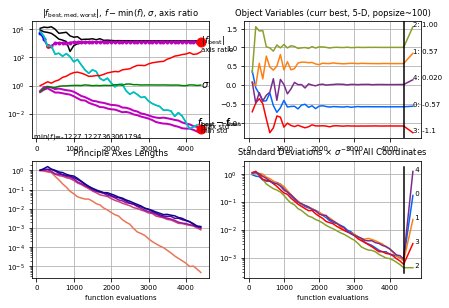

In [6]:
plt.figure(dpi=300)
optim.es.logger.plot()

In [7]:
anm = optim.anm_gen.get_beam_profile(optim.es.best.x)
anm

array([ 0.        ,  0.        ,  0.        , -0.56753908,  0.57470347,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  1.00242986, -1.07634634,  0.0197264 ])

In [8]:
W = optim.dimer.calc_radial_work(optim.separation, optim.target_angle, anm)
W_angle = optim.dimer.calc_angular_work(optim.thetas, optim.target_dist, anm)

Text(0.5, 1.0, 'Radial work curve')

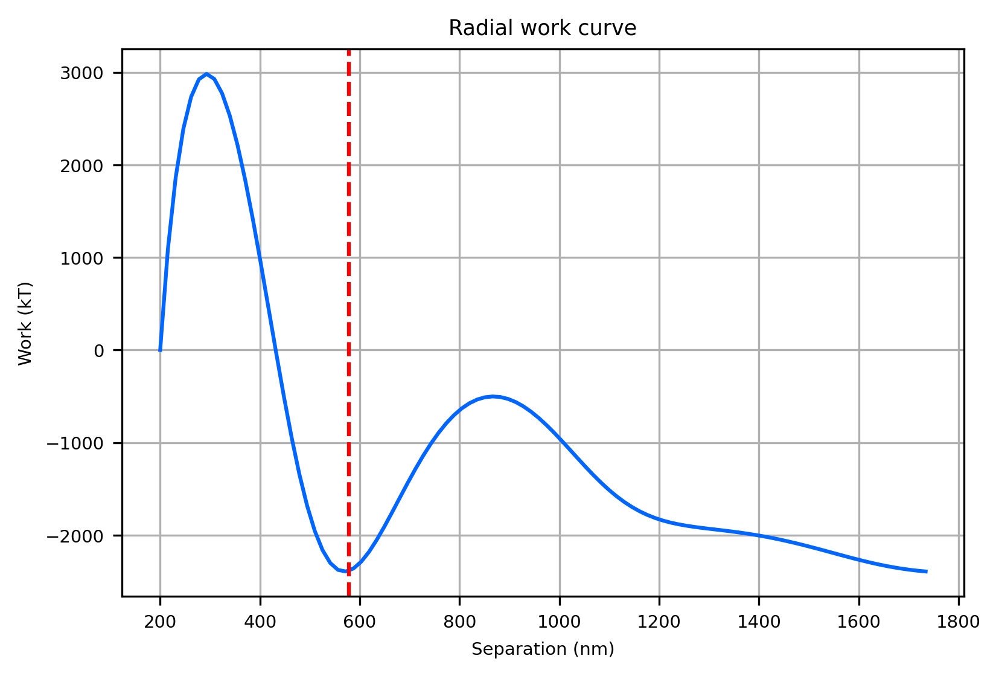

In [9]:
plt.figure(dpi=300)
plt.grid()
plt.plot(optim.separation / nm, W / kT)
plt.axvline(optim.target_dist / nm, c='r', linestyle='--')
plt.xlabel('Separation (nm)')
plt.ylabel('Work (kT)')
plt.title('Radial work curve')

Text(0.5, 1.0, 'Angular work curve')

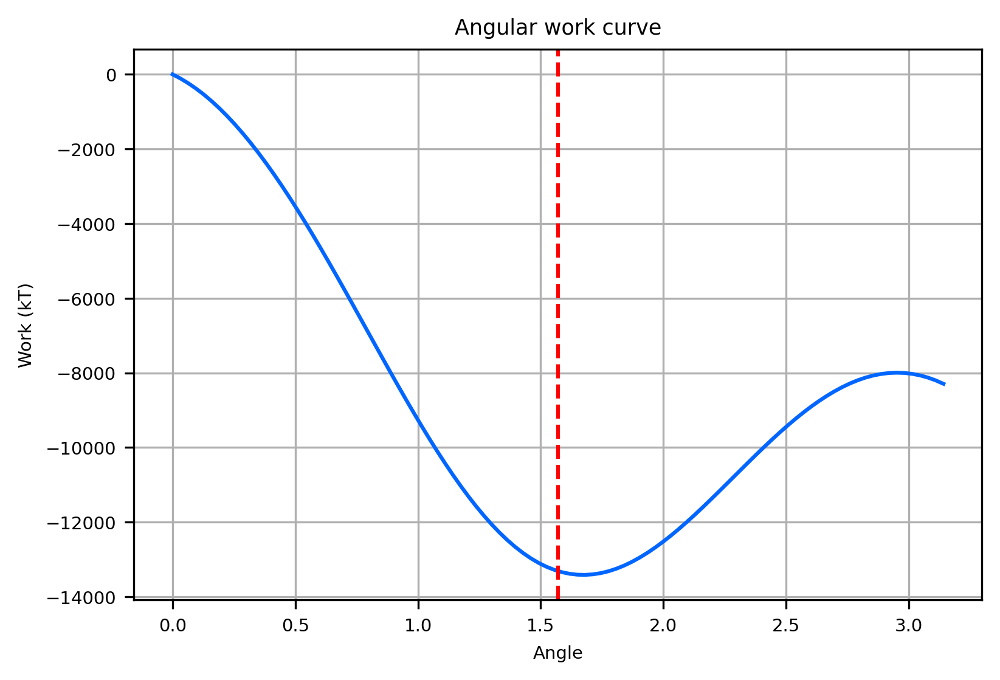

In [10]:
plt.figure(dpi=300)
plt.grid()
plt.plot(optim.thetas, W_angle / kT)
plt.axvline(optim.target_angle, c='r', linestyle='--')
plt.xlabel('Angle')
plt.ylabel('Work (kT)')
plt.title('Angular work curve')

In [11]:
size = 2000*nm
Nx = 32
### X,Y grid for computing fields
x = np.linspace(-size/2, size/2, Nx)
y = np.linspace(-size/2, size/2, Nx)
X, Y = np.meshgrid(x, y, indexing='ij')
Z = np.zeros_like(X)

E = optim.dimer._get_source(anm).E_field(X, Y, Z, optim.dimer.k, sampling=optim.dimer.e_field_sampling)

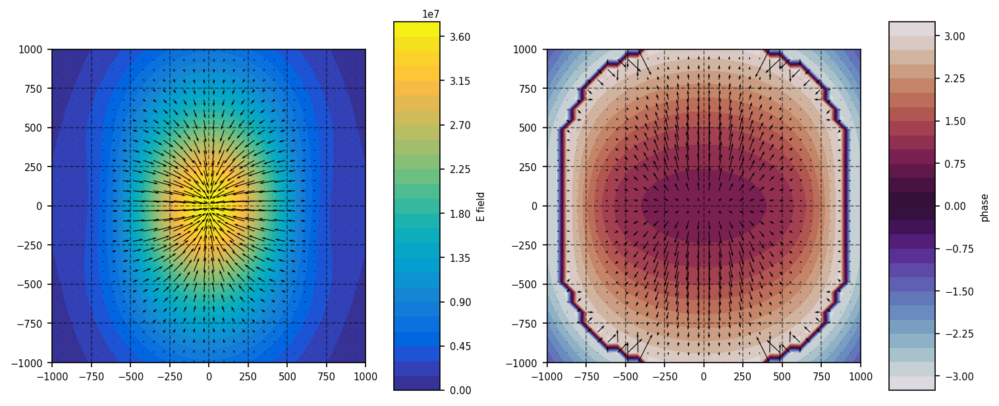

In [12]:
fig, ax = plt.subplots(ncols=2, figsize=(10,4), constrained_layout=True, dpi=150)

I = np.sum(np.abs(E)**2, axis=0)
im = ax[0].contourf(X/nm, Y/nm, I**.5, cmap=cmap['parula'], levels=30)
plt.colorbar(im, ax=ax[0], label='E field')

dx, dy = np.gradient(I)
#norm = np.linalg.norm(np.array((dx, dy)), axis=0)
#dx = dx / norm
#dy = dy / norm
ax[0].quiver(X/nm, Y/nm, dx, dy)

phase = np.angle(E[0] - 1j*E[1])
im = ax[1].contourf(X/nm, Y/nm, phase, cmap='twilight', levels=30)
plt.colorbar(im, ax=ax[1], label='phase')

dx, dy = I * np.gradient(phase)
ax[1].quiver(X/nm, Y/nm, dx, dy)

for axs in ax:
    axs.set_aspect('equal')
    axs.grid(color='k', linestyle='dashed', alpha=0.5)

In [13]:
Nx = 256
theta = np.linspace(0, 1, Nx)
phi = np.linspace(0, 2 * np.pi, Nx)
THETA, PHI = np.meshgrid(theta, phi, indexing='ij')
x = np.sin(THETA) * np.cos(PHI)
y = np.sin(THETA) * np.sin(PHI)
phase = slm(THETA, PHI, anm, optim.dimer.Nmax, optim.dimer.rho_scale)
phase.max() - phase.min()

2.90082066166971

Text(0.5, 1.0, 'Phase range: 2.901')

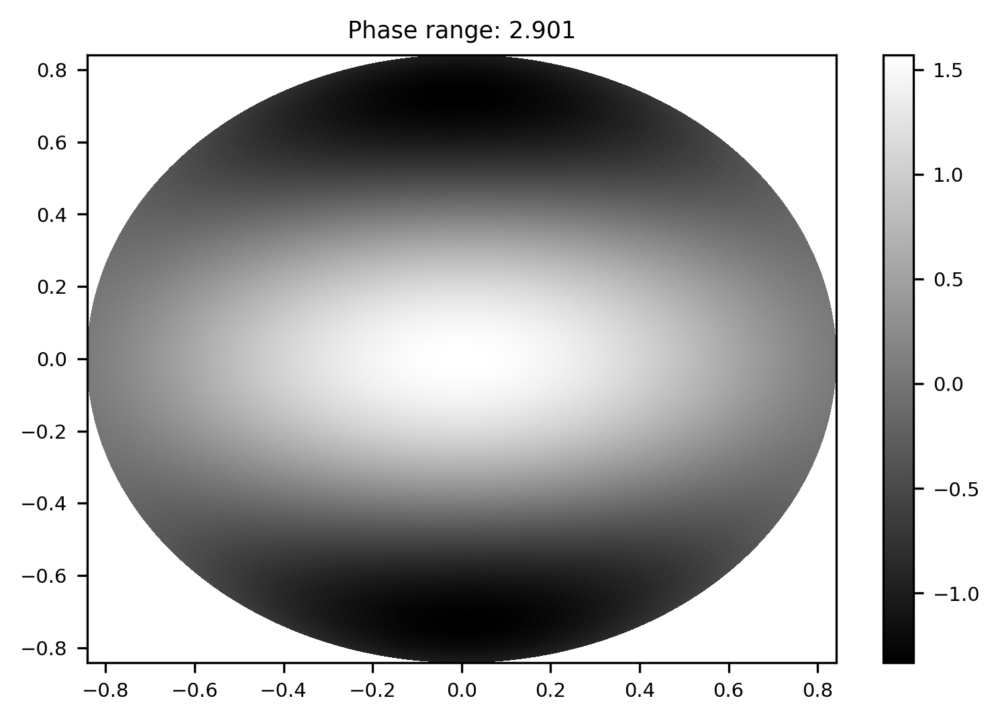

In [14]:
plt.figure(dpi=300)
im= plt.pcolormesh(x, y, phase, shading='gourard', rasterized=True, cmap='gray')
plt.colorbar(im)
plt.title(f'Phase range: {phase.max() - phase.min():.4g}')

In [15]:
init_sep = 600 * nm
init_angle = np.pi / 2
n_steps = ms2steps(100, dt=5000 * 1e-9)
pos = optim.dimer.sim(init_sep, init_angle, n_steps, anm)

100%|██████████| 20000/20000 [00:36<00:00, 549.46it/s]


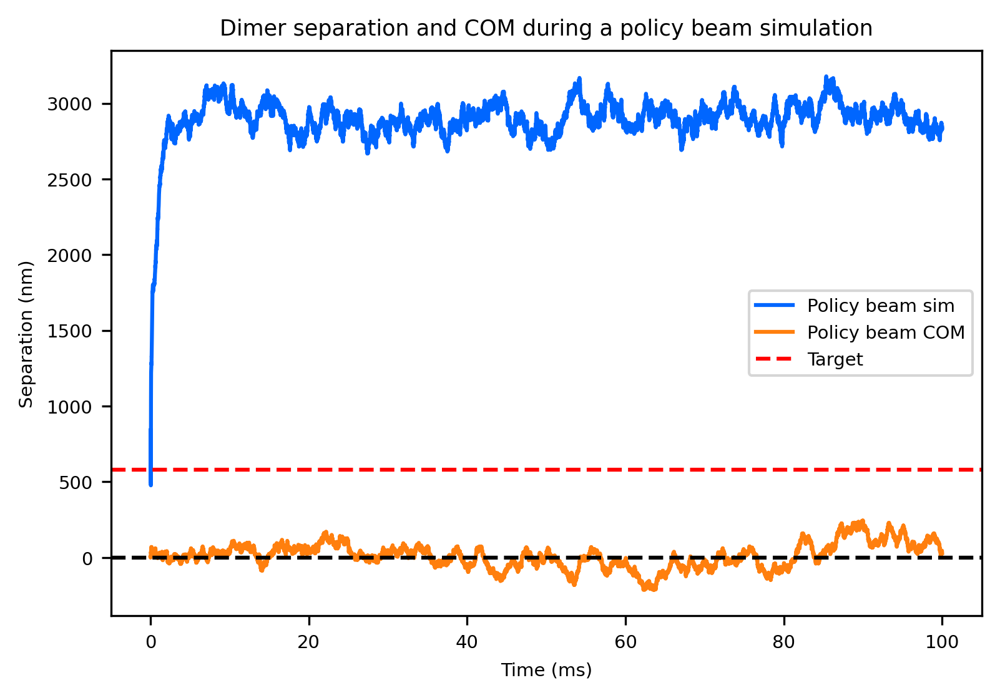

In [16]:
sim_separation = np.linalg.norm(pos[:, 0] - pos[:, 1], axis=-1) / nm
sim_com = np.mean(pos[:, 0] + pos[:, 1], axis=-1) / nm
t = np.linspace(0, 100, num=sim_separation.size)

plt.figure(dpi=300)
plt.plot(t, sim_separation, label='Policy beam sim')
plt.plot(t, sim_com, label='Policy beam COM')
plt.xlabel('Time (ms)')
plt.ylabel('Separation (nm)')
plt.axhline(y=optim.target_dist / nm, c='r', linestyle='--', label='Target')
plt.axhline(y=0, c='k', linestyle='--')
plt.title("Dimer separation and COM during a policy beam simulation")
plt.legend()

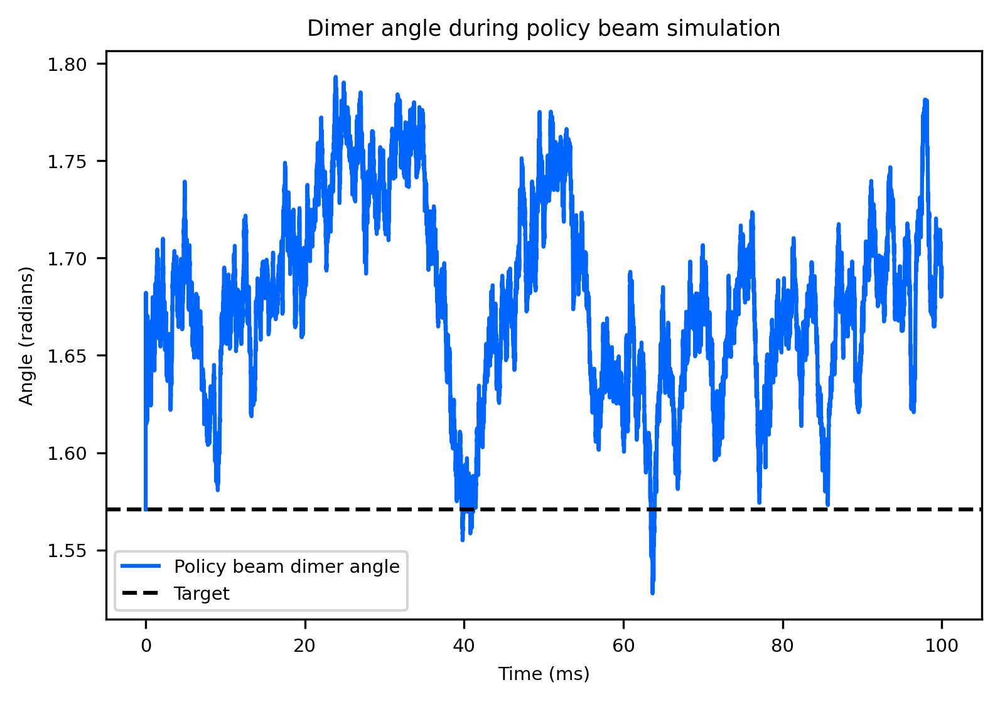

In [17]:
vec = pos[:, 1] - pos[:, 0] # abs to factor out permuational symmetry
sim_angles = np.arccos(vec[:, 0] / np.linalg.norm(vec, axis=1))

plt.figure(dpi=300)
plt.plot(t, sim_angles, label='Policy beam dimer angle')
plt.axhline(y=np.pi/2, c='k', linestyle='--', label='Target')
plt.xlabel('Time (ms)')
plt.ylabel('Angle (radians)')
plt.title("Dimer angle during policy beam simulation")
plt.legend()

/home/kirills/.local/lib/python3.7/site-packages/seaborn/distributions.py:434: UserWarning: The following kwargs were not used by contour: 'thresh'
  cset = contour_func(xx, yy, z, n_levels, **kwargs)


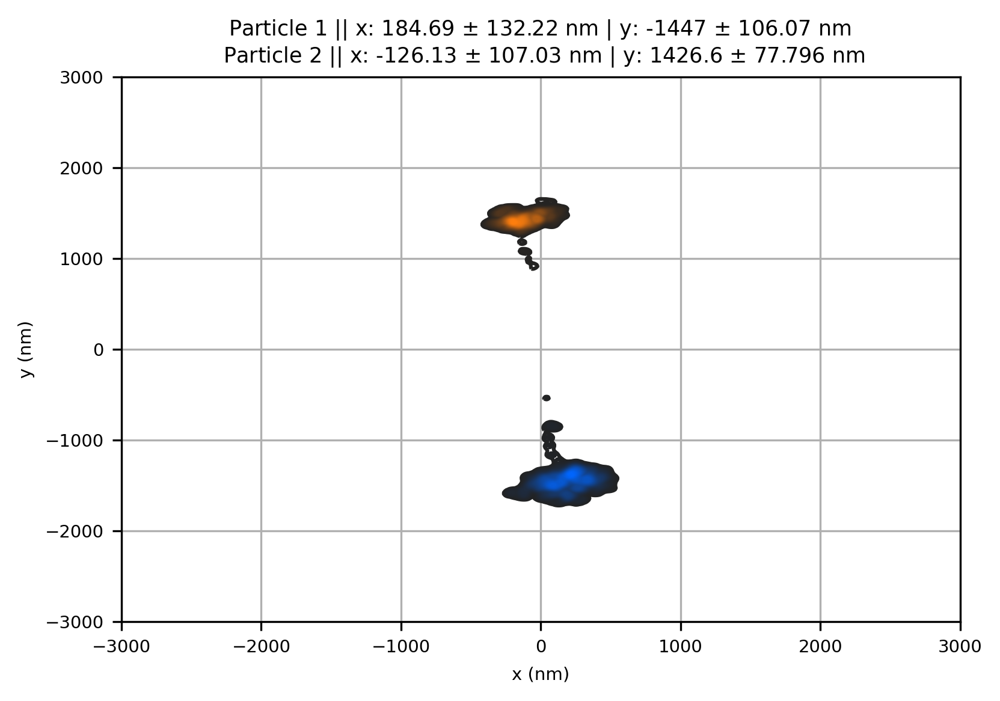

In [18]:
plt.figure(dpi=300)
sns.kdeplot(data = pos[:, 0, 0] / nm, data2 = pos[:, 0, 1] / nm, shade=False, thresh=0, levels=100)
sns.kdeplot(data = pos[:, 1, 0] / nm, data2 = pos[:, 1, 1] / nm, shade=False, thresh=0, levels=100)
plt.xlim(-3000, 3000)
plt.ylim(-3000, 3000)
plt.xlabel('x (nm)')
plt.ylabel('y (nm)')
plt.title(f"Particle 1 || x: {pos[:, 0, 0].mean() / nm:.5g} $\pm$ {pos[:, 0, 0].std() / nm:.5g} nm | y: {pos[:, 0, 1].mean() / nm:.5g} $\pm$ {pos[:, 0, 1].std() / nm:.5g} nm \n Particle 2 || x: {pos[:, 1, 0].mean() / nm:.5g} $\pm$ {pos[:, 1, 0].std() / nm:.5g} nm | y: {pos[:, 1, 1].mean() / nm:.5g} $\pm$ {pos[:, 1, 1].std() / nm:.5g} nm")
plt.grid()

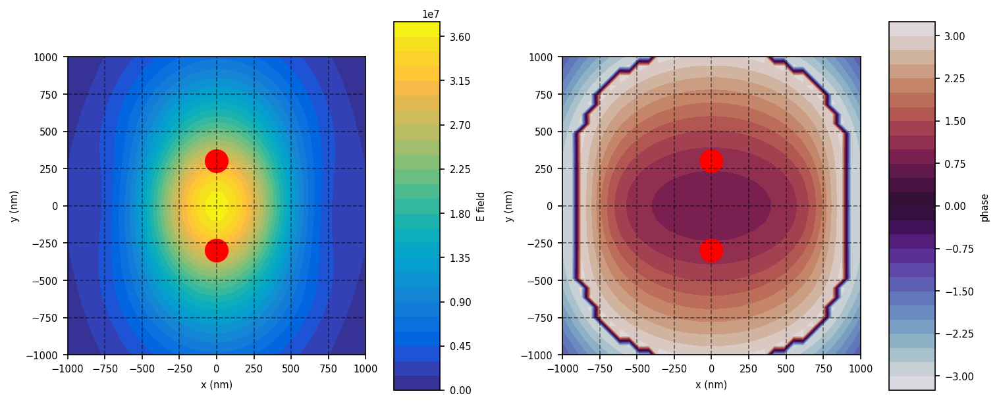

In [19]:
import matplotlib
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.rcParams['animation.ffmpeg_path'] = '/project2/andrewferguson/Kirill/env_kirills/bin/ffmpeg'
plt.ioff()
fig, ax = plt.subplots(ncols=2, figsize=(10,4), constrained_layout=True)

I = np.sum(np.abs(E)**2, axis=0)
im = ax[0].contourf(X/nm, Y/nm, I**.5, cmap=cmap['parula'], levels=30)
plt.colorbar(im, ax=ax[0], label='E field')

phase = np.angle(E[0] - 1j*E[1])
im = ax[1].contourf(X/nm, Y/nm, phase, cmap='twilight', levels=30)
plt.colorbar(im, ax=ax[1], label='phase')

for axs in ax:
    axs.set_aspect('equal')
    axs.set_xlabel('x (nm)')
    axs.set_ylabel('y (nm)')
    axs.grid(color='k', linestyle='dashed', alpha=0.5)


pos_frames = pos[::200][:100]#[:ms2steps(100)][::100]
for p in pos_frames[0]:
    
    C = plt.Circle(p[:2]/nm, radius=optim.dimer.radius / nm, color='C3')
    ax[0].add_patch(C)
    C = plt.Circle(p[:2]/nm, radius=optim.dimer.radius / nm, color='C3')
    ax[1].add_patch(C)

def update(t):
    pos_t = pos_frames[t]
    ax[0].patches = []
    ax[0].grid(color='k', linestyle='dashed', alpha=0.5)
    ax[1].patches = []
    ax[1].grid(color='k', linestyle='dashed', alpha=0.5)
    for p in pos_t:
        C = plt.Circle(p[:2]/nm, radius=optim.dimer.radius / nm, color='C3')
        ax[0].add_patch(C)
        C = plt.Circle(p[:2]/nm, radius=optim.dimer.radius / nm, color='C3')
        ax[1].add_patch(C)

ani = matplotlib.animation.FuncAnimation(fig, update, frames=100)
ani